# Stable Diffusion Encoder-Decoder: Exploring the VAE Latent Space

This notebook provides a detailed, hands-on exploration of the **Variational Autoencoder (VAE)** at the heart of Stable Diffusion's latent diffusion architecture. Rather than working with raw $3 \times 512 \times 512$ pixel images, Stable Diffusion performs the diffusion process in a compressed **latent space** produced by a pretrained VAE, dramatically reducing computational cost while preserving image quality.

**Learning objectives:**

1. Understand the VAE encoder $z = E(x)$ and decoder $\widehat{x} = D(z)$, and how they compress images from pixel space to latent space.
2. Explore the **noise scheduler** and see how noise levels ($\sigma$) vary across diffusion timesteps.
3. Implement **image-to-image** generation by starting from a noised encoding rather than pure noise.
4. Investigate whether the encoder--decoder pair forms an **identity mapping**: does $D(E(x)) = x$, or does $E(D(z)) = z$?
5. Test the **linearity** of the decoder: does $D(\lambda z_1 + (1-\lambda) z_2) \approx \lambda D(z_1) + (1-\lambda) D(z_2)$?
6. Dissect the **CLIP text encoder** pipeline: tokenization, token embeddings, positional embeddings, and the transformer model that produces conditioning vectors for the U-Net.

## Setup and Imports

**Requirements:** `transformers`, `diffusers`, `ftfy`, `accelerate`, `torch`, `torchvision`, `Pillow`, `matplotlib`, `tqdm`. You also need a Hugging Face account with access to `CompVis/stable-diffusion-v1-4` -- see the [model card](https://huggingface.co/CompVis/stable-diffusion-v1-4) for license details.

In [ ]:
# If running for the first time, uncomment and run:
# !pip install -q --upgrade transformers diffusers ftfy accelerate

In [2]:
from base64 import b64encode

import numpy
import torch
from diffusers import AutoencoderKL, LMSDiscreteScheduler, UNet2DConditionModel
from huggingface_hub import notebook_login

# For video display:
from IPython.display import HTML
from matplotlib import pyplot as plt
from pathlib import Path
from PIL import Image
from torch import autocast
from torchvision import transforms as tfms
from tqdm.auto import tqdm
from transformers import CLIPTextModel, CLIPTokenizer, logging
import os

torch.manual_seed(1)
if not (Path.home()/'.cache/huggingface'/'token').exists(): notebook_login()

# Supress some unnecessary warnings when loading the CLIPTextModel
logging.set_verbosity_error()

# Set device
torch_device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
if "mps" == torch_device: os.environ['PYTORCH_ENABLE_MPS_FALLBACK'] = "1"

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


Moving 0 files to the new cache system


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


0it [00:00, ?it/s]

## Loading the models

This code (and that in the next section) comes from the [Huggingface example notebook](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/stable_diffusion.ipynb).

This will download and set up the relevant models and components we'll be using. Let's just run this for now and move on to the next section to check that it all works before diving deeper.

If you've loaded a pipeline, you can also access these components using `pipe.unet`, `pipe.vae` and so on.

In this notebook we aren't doing any memory-saving tricks - if you find yourself running out of GPU RAM, look at the pipeline code for inspiration with things like attention slicing, switching to half precision (fp16), keeping the VAE on the CPU and other modifications.

In [59]:
# Load the autoencoder model which will be used to decode the latents into image space.
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")

# Load the tokenizer and text encoder to tokenize and encode the text.
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")

# The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet")

# The noise scheduler
scheduler = LMSDiscreteScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000)

# To the GPU we go!
vae = vae.to(torch_device)
text_encoder = text_encoder.to(torch_device)
unet = unet.to(torch_device);

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1150: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


## A diffusion loop

If all you want is to make a picture with some text, you could ignore this notebook and use one of the existing tools (such as [DreamStudio](https://beta.dreamstudio.ai/)) or use the simplified pipeline from huggingface, as documented [here](https://huggingface.co/blog/stable_diffusion).

What we want to do in this notebook is dig a little deeper into how this works, so we'll start by checking that the example code runs. Again, this is adapted from the [HF notebook](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/stable_diffusion.ipynb) and looks very similar to what you'll find if you inspect [the `__call__()` method of the stable diffusion pipeline](https://github.com/huggingface/diffusers/blob/main/src/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py#L200).  

<ipython-input-60-dbcc7b5dbc4f>:31: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (batch_size, unet.in_channels, height // 8, width // 8),


  0%|          | 0/30 [00:00<?, ?it/s]

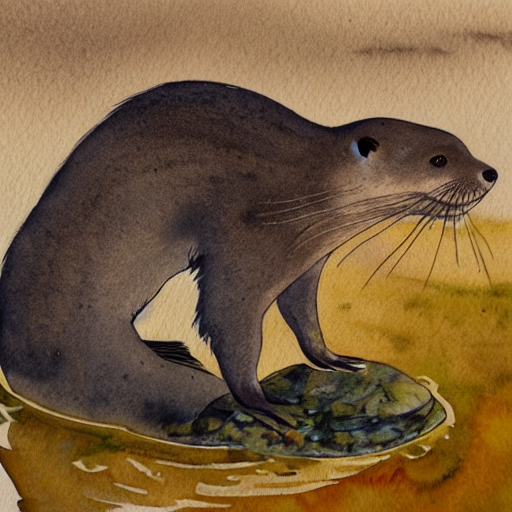

In [60]:
# Some settings
prompt = ["A watercolor painting of an otter"]
height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion
num_inference_steps = 30            # Number of denoising steps
guidance_scale = 7.5                # Scale for classifier-free guidance
generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise
batch_size = 1

# Prep text
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
with torch.no_grad():
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

# Prep Scheduler
def set_timesteps(scheduler, num_inference_steps):
    scheduler.set_timesteps(num_inference_steps)
    scheduler.timesteps = scheduler.timesteps.to(torch.float32) # minor fix to ensure MPS compatibility, fixed in diffusers PR 3925

set_timesteps(scheduler,num_inference_steps)

# Prep latents
latents = torch.randn(
  (batch_size, unet.in_channels, height // 8, width // 8),
  generator=generator,
)
latents = latents.to(torch_device)
latents = latents * scheduler.init_noise_sigma # Scaling (previous versions did latents = latents * self.scheduler.sigmas[0]

# Loop
with autocast("cuda"):  # will fallback to CPU if no CUDA; no autocast for MPS
    for i, t in tqdm(enumerate(scheduler.timesteps), total=len(scheduler.timesteps)):
        # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
        latent_model_input = torch.cat([latents] * 2)
        sigma = scheduler.sigmas[i]
        # Scale the latents (preconditioning):
        # latent_model_input = latent_model_input / ((sigma**2 + 1) ** 0.5) # Diffusers 0.3 and below
        latent_model_input = scheduler.scale_model_input(latent_model_input, t)

        # predict the noise residual
        with torch.no_grad():
            noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

        # perform guidance
        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        # compute the previous noisy sample x_t -> x_t-1
        # latents = scheduler.step(noise_pred, i, latents)["prev_sample"] # Diffusers 0.3 and below
        latents = scheduler.step(noise_pred, t, latents).prev_sample

# scale and decode the image latents with vae
latents = 1 / 0.18215 * latents
with torch.no_grad():
    image = vae.decode(latents).sample

# Display
image = (image / 2 + 0.5).clamp(0, 1)
image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
images = (image * 255).round().astype("uint8")
pil_images = [Image.fromarray(image) for image in images]
pil_images[0]

It's working, but that's quite a bit of code! Let's look at the components one by one.

## The Autoencoder (VAE)

The key innovation of **latent diffusion** (Rombach et al., 2022) is to perform the diffusion process not on raw pixels but in a compressed **latent space** produced by a pretrained autoencoder. The VAE consists of two parts:

$$z = E(x), \qquad \widehat{x} = D(z),$$

where $E$ is the encoder and $D$ is the decoder. The encoder compresses a $3 \times 512 \times 512$ image $x$ into a $4 \times 64 \times 64$ latent tensor $z$, achieving a spatial downsampling factor of $8\times$ in each dimension. The constant `0.18215` that appears in the code is a scaling factor chosen so that the latent distribution has unit variance, matching the noise schedule used during diffusion training.

Below we wrap the encode and decode operations into helper functions. Note the pixel-value rescaling: images are mapped from $[0, 1]$ to $[-1, 1]$ before encoding, and mapped back after decoding.

In [61]:
def pil_to_latent(input_im):
    # Single image -> single latent in a batch (so size 1, 4, 64, 64)
    with torch.no_grad():
        latent = vae.encode(tfms.ToTensor()(input_im).unsqueeze(0).to(torch_device)*2-1) # Note scaling
    return 0.18215 * latent.latent_dist.sample()

def latents_to_pil(latents):
    # bath of latents -> list of images
    latents = (1 / 0.18215) * latents
    with torch.no_grad():
        image = vae.decode(latents).sample
    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (image * 255).round().astype("uint8")
    pil_images = [Image.fromarray(image) for image in images]
    return pil_images

We'll use a pic from the web here, but you can load your own instead by uploading it and editing the filename in the next cell.

In [6]:
# Download a demo Image
!curl --output macaw.jpg 'https://lafeber.com/pet-birds/wp-content/uploads/2018/06/Scarlet-Macaw-2.jpg'

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 62145  100 62145    0     0   103k      0 --:--:-- --:--:-- --:--:--  103k


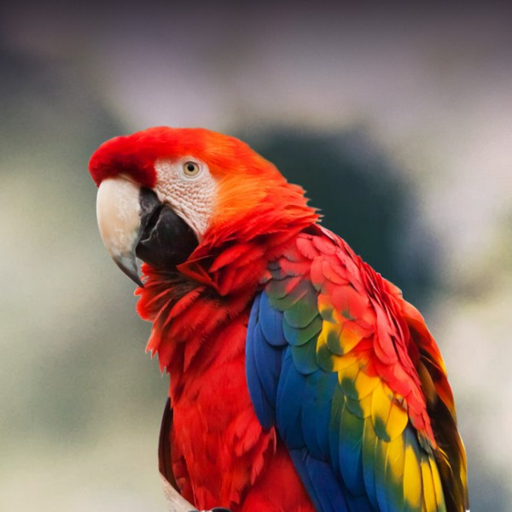

In [7]:
# Load the image with PIL
input_image = Image.open('macaw.jpg').resize((512, 512))
input_image

Encoding this into the latent space of the AE with the function defined above looks like this:

In [8]:
# Encode to the latent space
encoded = pil_to_latent(input_image)
encoded.shape

torch.Size([1, 4, 64, 64])

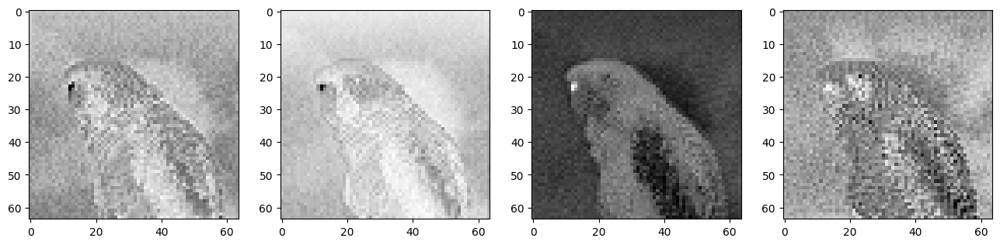

In [9]:
# Let's visualize the four channels of this latent representation:
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
for c in range(4):
    axs[c].imshow(encoded[0][c].cpu(), cmap='Greys')

This 4x64x64 tensor captures lots of information about the image, hopefully enough that when we feed it through the decoder we get back something very close to our input image:

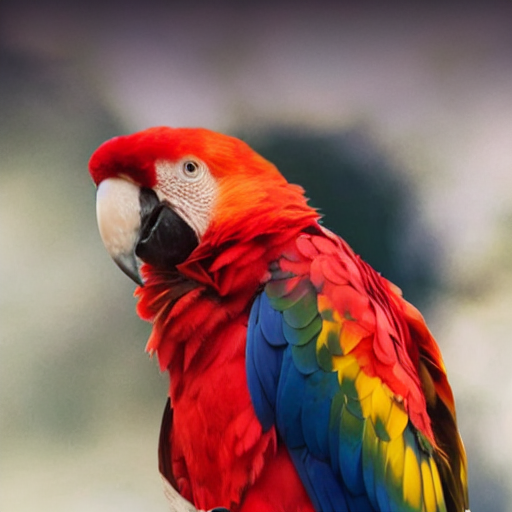

In [10]:
# Decode this latent representation back into an image
decoded = latents_to_pil(encoded)[0]
decoded

### Interpreting reconstruction quality

You may notice small differences between the original and the reconstruction $\widehat{x} = D(E(x))$ -- look closely at fine details like the eye. This is expected: the autoencoder is **lossy**. The VAE was trained with a combination of reconstruction loss, perceptual loss (LPIPS), and a KL divergence penalty, so it prioritizes perceptually important features over pixel-exact reproduction.

**Compression ratio.** The input is $3 \times 512 \times 512 = 786{,}432$ values, compressed to $4 \times 64 \times 64 = 16{,}384$ latent values -- a $48\times$ compression. Each $3 \times 8 \times 8$ pixel block maps to just 4 numbers. Higher compression (e.g., $f = 16$ as in some VQGAN models) is possible but introduces more visible artifacts.

**Why use latent space at all?** Pixel-space diffusion on $512 \times 512$ images is extremely expensive because the U-Net must process the full resolution at every denoising step. Latent diffusion reduces the spatial dimensions by $8\times$ in each direction, cutting the number of spatial tokens by $64\times$. This makes high-resolution generation feasible on consumer hardware. After the diffusion process produces a final latent $z_0$, the decoder $D$ maps it back to pixel space in a single forward pass.

# The Scheduler
Now we need to talk about adding noise...

During training, we add some noise to an image an then have the model try to predict the noise. If we always added a ton of noise, the model might not have much to work with. If we only add a tiny amount, the model won't be able to do much with the random starting points we use for sampling. So during training the amount is varied, according to some distribution.

During sampling, we want to 'denoise' over a number of steps. How many steps and how much noise we should aim for at each step are going to affect the final result.

The scheduler is in charge of handling all of these details. For example: `scheduler = LMSDiscreteScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000)` sets up a scheduler that matches the one used to train this model. When we want to sample over a smaller number of steps, we set this up with `scheduler.set_timesteps`:

In [11]:
# Setting the number of sampling steps:
set_timesteps(scheduler, 15)

You can see how our new set of steps corresponds to those used in training:

In [12]:
# See these in terms of the original 1000 steps used for training:
print(scheduler.timesteps)

tensor([999.0000, 927.6429, 856.2857, 784.9286, 713.5714, 642.2143, 570.8571,
        499.5000, 428.1429, 356.7857, 285.4286, 214.0714, 142.7143,  71.3571,
          0.0000])


And how much noise is present at each:

In [13]:
# Look at the equivalent noise levels:
print(scheduler.sigmas)

tensor([14.6146,  9.6826,  6.6780,  4.7746,  3.5221,  2.6666,  2.0606,  1.6156,
         1.2768,  1.0097,  0.7913,  0.6056,  0.4397,  0.2780,  0.0292,  0.0000])


During sampling, we'll start at a high noise level (in fact, our input will be pure noise) and gradually 'denoise' down to an image, according to this schedule.

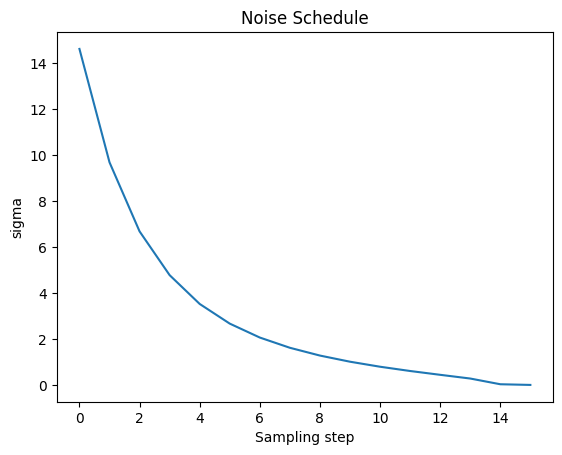

In [14]:
# Plotting this noise schedule:
plt.plot(scheduler.sigmas)
plt.title('Noise Schedule')
plt.xlabel('Sampling step')
plt.ylabel('sigma')
plt.show()

This 'sigma' is the amount of noise added to the latent representation. Let's visualize what this looks like by adding a bit of noise to our encoded image and then decoding this noised version:

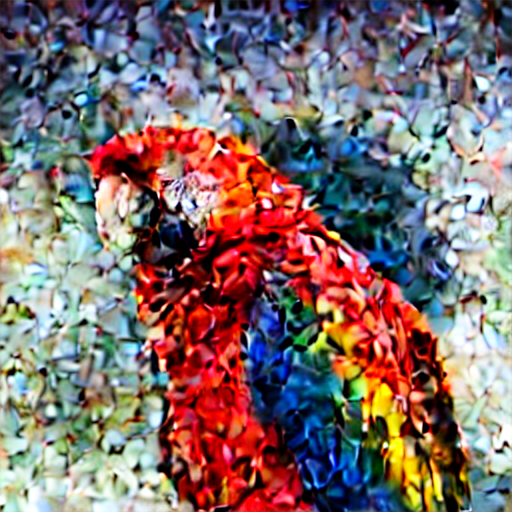

In [16]:
noise = torch.randn_like(encoded) # Random noise
sampling_step = 10 # Equivalent to step 10 out of 15 in the schedule above
# encoded_and_noised = scheduler.add_noise(encoded, noise, timestep) # Diffusers 0.3 and below
encoded_and_noised = scheduler.add_noise(encoded, noise, timesteps=torch.tensor([scheduler.timesteps[sampling_step]]))
latents_to_pil(encoded_and_noised.float())[0] # Display

What does this look like at different timesteps? Experiment and see for yourself!

If you uncomment the cell below you'll see that in this case the `scheduler.add_noise` function literally just adds noise scaled by sigma: `noisy_samples = original_samples + noise * sigmas`

In [17]:
# ??scheduler.add_noise

Other diffusion models may be trained with different noising and scheduling approaches, some of which keep the variance fairly constant across noise levels ('variance preserving') with different scaling and mixing tricks instead of having noisy latents with higher and higher variance as more noise is added ('variance exploding').

If we want to start from random noise instead of a noised image, we need to scale it by the largest sigma value used during training, ~14 in this case. And before these noisy latents are fed to the model they are scaled again in the so-called pre-conditioning step:
`latent_model_input = latent_model_input / ((sigma**2 + 1) ** 0.5)` (now handled by `latent_model_input = scheduler.scale_model_input(latent_model_input, t)`).

Again, this scaling/pre-conditioning differs between papers and implementations, so keep an eye out for this if you work with a different type of diffusion model.

## Loop starting from noised version of input (AKA image2image)

Let's see what happens when we use our image as a starting point, adding some noise and then doing the final few denoising steps in the loop with a new prompt.

We'll use a similar loop to the first demo, but we'll skip the first `start_step` steps.

To noise our image we'll use code like that shown above, using the scheduler to noise it to a level equivalent to step 10 (`start_step`).

  0%|          | 0/50 [00:00<?, ?it/s]

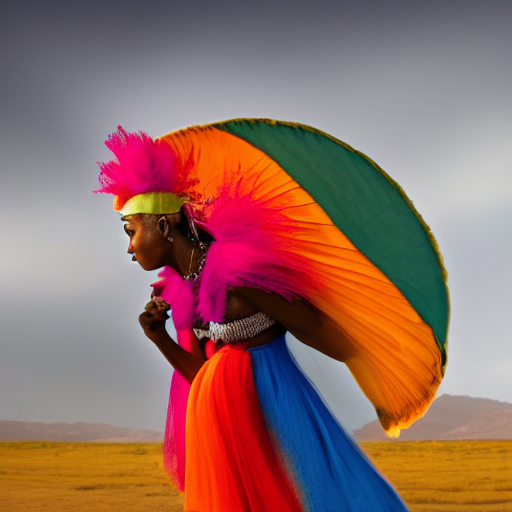

In [18]:
# Settings (same as before except for the new prompt)
prompt = ["A colorful dancer, nat geo photo"]
height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion
num_inference_steps = 50            # Number of denoising steps
guidance_scale = 8                  # Scale for classifier-free guidance
generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise
batch_size = 1

# Prep text (same as before)
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
with torch.no_grad():
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

# Prep Scheduler (setting the number of inference steps)
set_timesteps(scheduler, num_inference_steps)

# Prep latents (noising appropriately for start_step)
start_step = 10
start_sigma = scheduler.sigmas[start_step]
noise = torch.randn_like(encoded)
latents = scheduler.add_noise(encoded, noise, timesteps=torch.tensor([scheduler.timesteps[start_step]]))
latents = latents.to(torch_device).float()

# Loop
for i, t in tqdm(enumerate(scheduler.timesteps), total=len(scheduler.timesteps)):
    if i >= start_step: # << This is the only modification to the loop we do

        # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
        latent_model_input = torch.cat([latents] * 2)
        sigma = scheduler.sigmas[i]
        latent_model_input = scheduler.scale_model_input(latent_model_input, t)

        # predict the noise residual
        with torch.no_grad():
            noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

        # perform guidance
        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        # compute the previous noisy sample x_t -> x_t-1
        latents = scheduler.step(noise_pred, t, latents).prev_sample

latents_to_pil(latents)[0]

You can see that some colours and structure from the image are kept, but we now have a new picture! The more noise you add and the more steps you do, the further away it gets from the input image.

This is how the popular img2img pipeline works. Again, if this is your end goal there are tools to make this easy!

But you can see that under the hood this is the same as the generation loop just skipping the first few steps and starting from a noised image rather than pure noise.

Explore changing how many steps are skipped and see how this affects the amount the image changes from the input.

# Exploring the Encoder-Decoder: Identity Mapping and Linearity

A natural mathematical question is whether the encoder-decoder pair forms an **identity mapping**. Specifically, we investigate two compositions:

- **Image space round-trip:** Given an image $x$, does $D(E(x)) = x$? (We already saw above that this is approximately true, with small reconstruction error.)
- **Latent space round-trip:** Given a latent $z$, does $E(D(z)) = z$?

Because the encoder maps to a *distribution* (it is a variational autoencoder), and because the intermediate decode-to-pixel step involves lossy quantization to 8-bit integers, we expect $E(D(z)) \neq z$ in general. The experiments below measure $\|z - E(D(z))\|_\infty$ to quantify this discrepancy.

We also test whether the decoder is approximately **linear** -- i.e., whether

$$D(\lambda z_1 + (1-\lambda) z_2) \approx \lambda D(z_1) + (1-\lambda) D(z_2).$$

If the decoder were a linear map, these would be identical. Since the decoder is a deep convolutional network, we expect some nonlinearity; comparing the two images reveals how much.

We first write an function that encapsulates the functionality of generating an image given initial latent variable and text prompt.

In [19]:
def SD_image_from_text(prompt, initial_latent, inference_steps):

  height = 512                        # default height of Stable Diffusion
  width = 512
  guidance_scale = 7.5                # Scale for classifier-free guidance
  generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise
  batch_size = 1

  # Prep text
  text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
  with torch.no_grad():
      text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]
  max_length = text_input.input_ids.shape[-1]
  uncond_input = tokenizer(
      [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
  )
  with torch.no_grad():
      uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]
  text_embeddings = torch.cat([uncond_embeddings, text_embeddings])


  set_timesteps(scheduler,inference_steps)

  # Prep latents (noising appropriately for start_step)
  start_step = 10
  start_sigma = scheduler.sigmas[start_step]
  noise = torch.randn_like(initial_latent)
  latents = scheduler.add_noise(initial_latent, noise, timesteps=torch.tensor([scheduler.timesteps[start_step]]))
  latents = latents.to(torch_device).float()

  # Loop
  with autocast("cuda"):  # will fallback to CPU if no CUDA; no autocast for MPS
      for i, t in tqdm(enumerate(scheduler.timesteps), total=len(scheduler.timesteps)):
          if i >= start_step:
              # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
              latent_model_input = torch.cat([latents] * 2)
              sigma = scheduler.sigmas[i]
              # Scale the latents (preconditioning):
              # latent_model_input = latent_model_input / ((sigma**2 + 1) ** 0.5) # Diffusers 0.3 and below
              latent_model_input = scheduler.scale_model_input(latent_model_input, t)

              # predict the noise residual
              with torch.no_grad():
                  noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

              # perform guidance
              noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
              noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

              # compute the previous noisy sample x_t -> x_t-1
              # latents = scheduler.step(noise_pred, i, latents)["prev_sample"] # Diffusers 0.3 and below
              latents = scheduler.step(noise_pred, t, latents).prev_sample


  image = latents_to_pil(latents)[0]
  image
  return image, latents




## Test this function by trying the random latent and encoded latent

<ipython-input-20-b01be4d24620>:4: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (batch_size, unet.in_channels, height // 8, width // 8),


  0%|          | 0/60 [00:00<?, ?it/s]

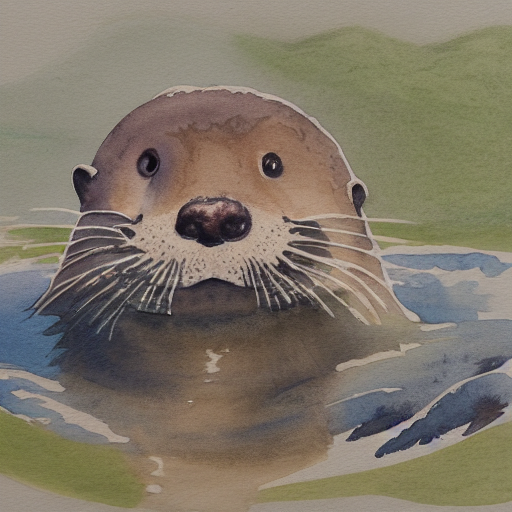

In [20]:
prompt = 'A watercolor painting of an otter'

random_latents = torch.randn(
  (batch_size, unet.in_channels, height // 8, width // 8),
  generator=generator,
)
random_latent = random_latents.to(torch_device)

image1, _ = SD_image_from_text(prompt, random_latent, 60)
image1




  0%|          | 0/100 [00:00<?, ?it/s]

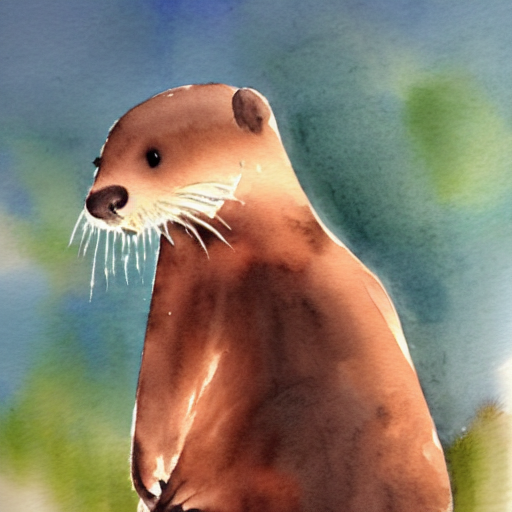

In [21]:
image2, _ = SD_image_from_text(prompt, encoded, 100)
image2


  0%|          | 0/50 [00:00<?, ?it/s]

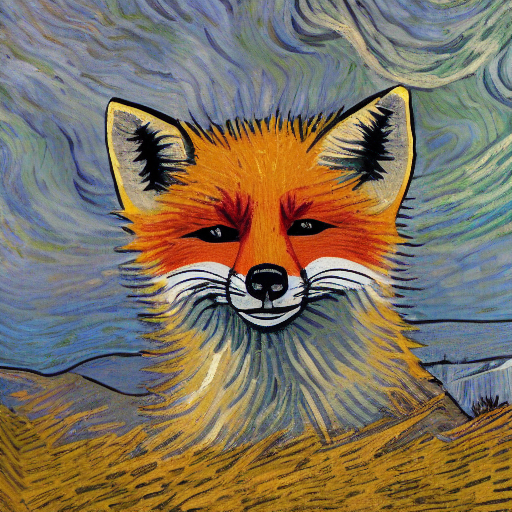

In [22]:
prompt = 'A picture of a fox sitting on a hill, van gogh style'

image1, latent1 = SD_image_from_text(prompt, random_latent, 50)
image1

  0%|          | 0/50 [00:00<?, ?it/s]

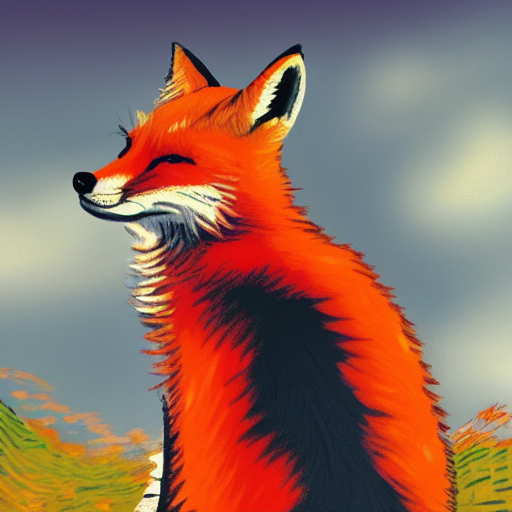

In [23]:
image2, latent2 = SD_image_from_text(prompt, encoded, 50)
image2

### Visualizing the latent channels

Below we plot the four channels of the final latent $z \in \mathbb{R}^{4 \times 64 \times 64}$ for each of the two generated images. Although the images were produced from the same prompt, they started from different initial latents (random noise vs. encoded macaw), so the spatial structure of the channels differs.

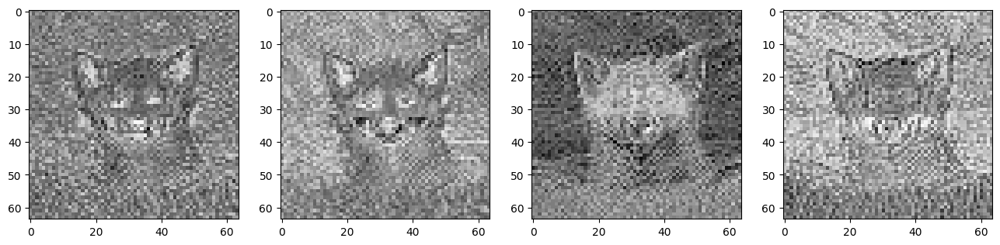

In [24]:
# Let's visualize the four channels of this latent representation:
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
for c in range(4):
    axs[c].imshow(latent1[0][c].cpu(), cmap='Greys')

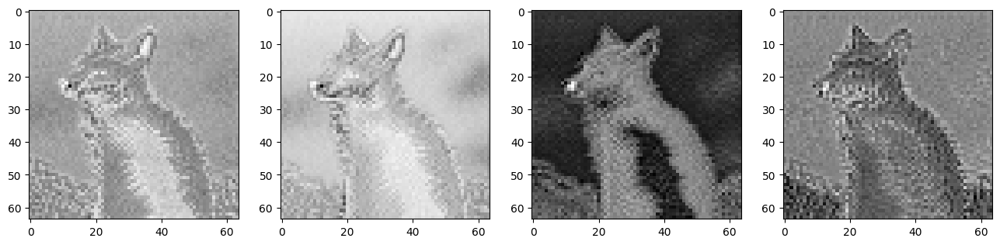

In [25]:
# Let's visualize the four channels of this latent representation:
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
for c in range(4):
    axs[c].imshow(latent2[0][c].cpu(), cmap='Greys')

### Latent averaging: $D\!\bigl(\tfrac{1}{2}(z_1 + z_2)\bigr)$ vs. $\tfrac{1}{2}\bigl(D(z_1) + D(z_2)\bigr)$

We compute the element-wise average of the two latent tensors, $z_3 = \tfrac{1}{2}(z_1 + z_2)$, and decode it. Then we compare this with the pixel-space average of the two decoded images. If the decoder were linear these would match exactly; the difference reveals the decoder's nonlinearity.

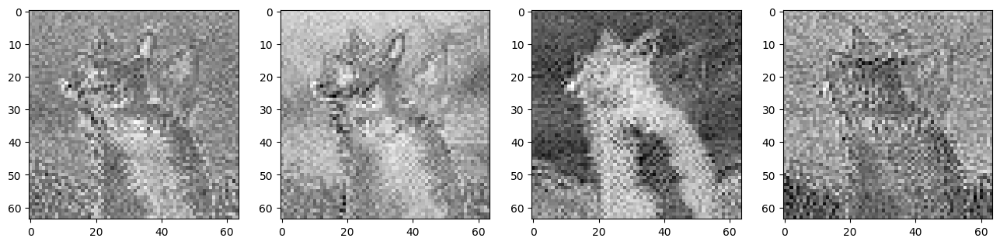

In [26]:
latent3 = (latent1 + latent2)/2
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
for c in range(4):
    axs[c].imshow(latent3[0][c].cpu(), cmap='Greys')

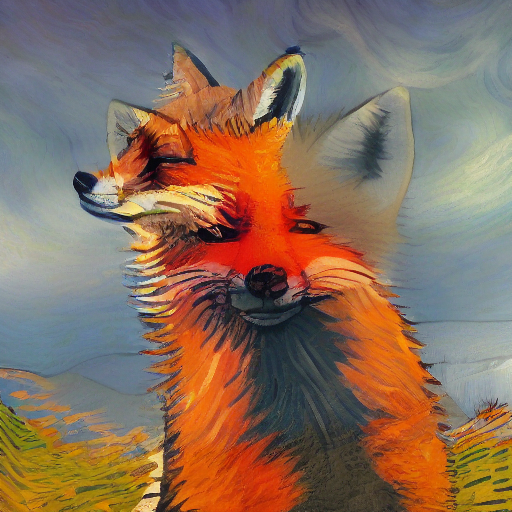

In [27]:
image3 = latents_to_pil(latent3.float())[0]
image3

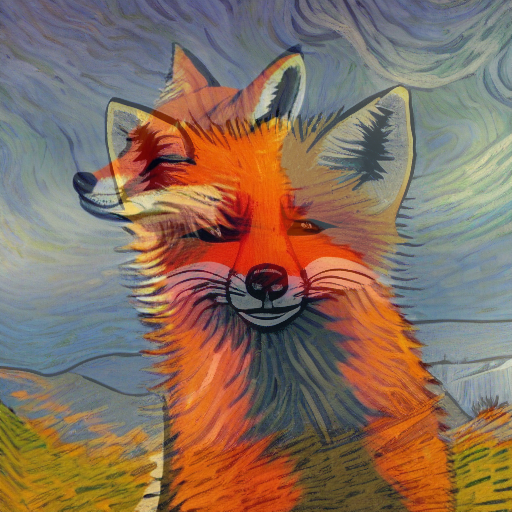

In [28]:
# Combine image1 and image2

latent_1 = (1 / 0.18215) * latent1
latent_2 = (1 / 0.18215) * latent2
with torch.no_grad():
    im_1 = vae.decode(latent_1).sample
    im_2 = vae.decode(latent_2).sample
    im_1 = (im_1 / 2 + 0.5).clamp(0, 1)
    im_2 = (im_2 / 2 + 0.5).clamp(0, 1)
    im_1 = im_1.detach().cpu().permute(0, 2, 3, 1).numpy()
    im_2 = im_2.detach().cpu().permute(0, 2, 3, 1).numpy()

    images = ((im_1 + im_2)/2 * 255).round().astype("uint8")
    image_31 = [Image.fromarray(image) for image in images]

image_31[0]

### Latent-space round-trip: does $E(D(z)) = z$?

We have already seen that $D(E(x)) \approx x$ (image-space round-trip). Now we test the other direction: given a latent $z$, we decode it to an image $\widehat{x} = D(z)$, re-encode that image, and check whether we recover the original latent:

$$z' = E(D(z)), \qquad \text{error} = \|z - z'\|_\infty.$$

Because the intermediate decode step maps to 8-bit pixel values (lossy quantization) and the encoder samples from a distribution, we expect $z' \neq z$. The cells below compute this error and visualize the original vs. re-encoded latent channels side by side.

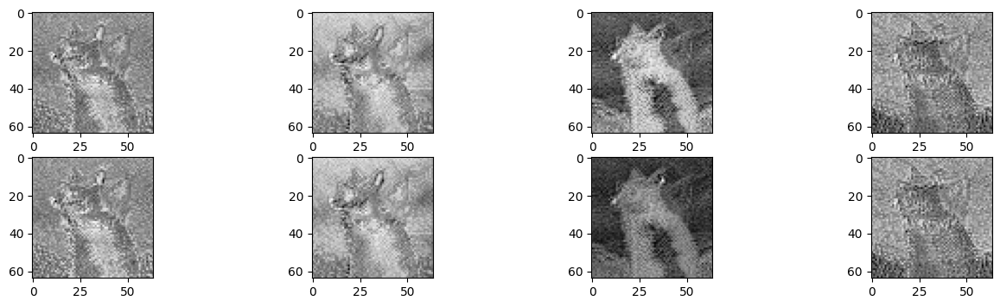

In [29]:
image3 = latents_to_pil(latent3.float())[0]
latent_3_new = pil_to_latent(image3)
error_norm = torch.norm(latent3.float() - latent_3_new.float(), float('inf'))
error_norm

fig, axs = plt.subplots(2, 4, figsize=(16, 4))
for c in range(4):
    axs[0][c].imshow(latent3[0][c].cpu(), cmap='Greys')
    axs[1][c].imshow(latent_3_new[0][c].cpu(), cmap='Greys')

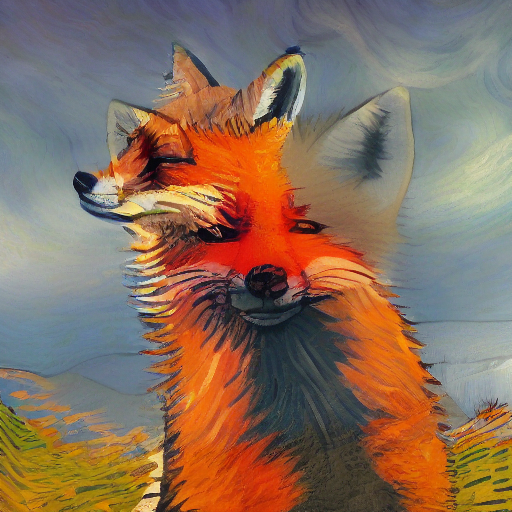

In [30]:
image3

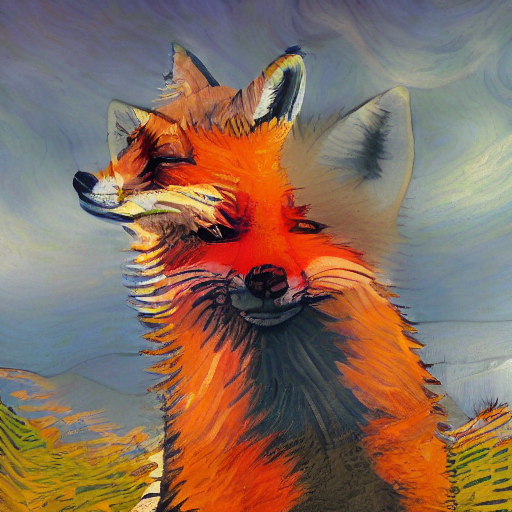

In [31]:
image3_new = latents_to_pil(latent_3_new.float())[0]
image3_new

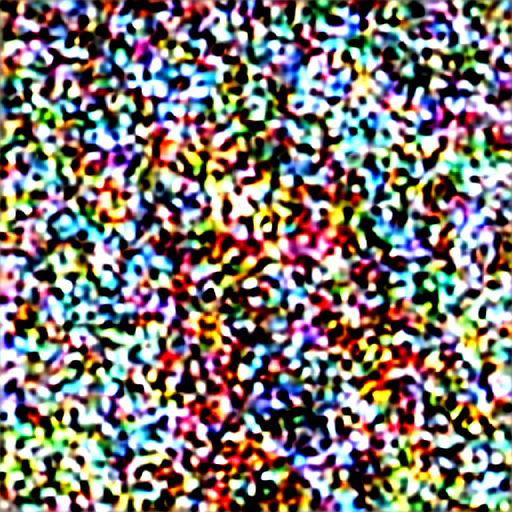

In [32]:
encoded = pil_to_latent(input_image)
encoded.shape

noise = torch.randn_like(encoded) # Random noise
sampling_step = 10 # Equivalent to step 10 out of 15 in the schedule above
# encoded_and_noised = scheduler.add_noise(encoded, noise, timestep) # Diffusers 0.3 and below
latent4 = scheduler.add_noise(encoded, noise, timesteps=torch.tensor([scheduler.timesteps[sampling_step]]))

image4 = latents_to_pil(latent4.float())[0]
latent_4_new = pil_to_latent(image4)
image4_new = latents_to_pil(latent_4_new)[0]
error_norm = torch.norm(latent4.float() - latent_4_new.float(), float('inf'))
error_norm

image4

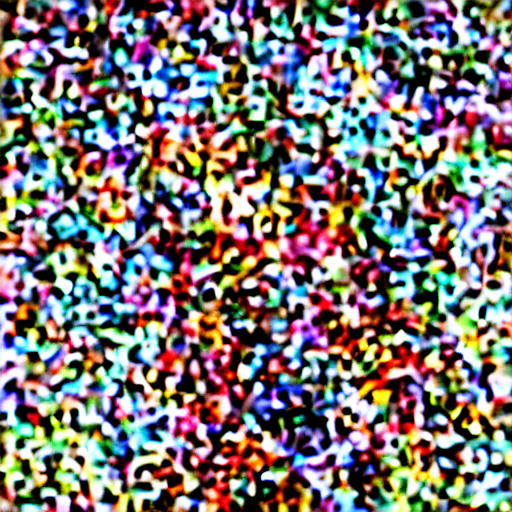

In [33]:
image4_new

### Testing decoder linearity

We now test the linearity hypothesis more carefully with a fresh pair of generated images. Given latents $z_1$ and $z_2$ and a mixing weight $\lambda \in [0, 1]$, we compare:

- **Left image:** $D(\lambda z_1 + (1-\lambda) z_2)$ -- decode the weighted average of latents.
- **Right image:** $\lambda D(z_1) + (1-\lambda) D(z_2)$ -- weighted average of the decoded images (computed in pixel space).

If $D$ were exactly linear these would be identical. The helper function below computes both and also re-encodes the pixel-space average back to latent space for comparison.

In [34]:
def average_two_latent(latent1_, latent2_, prob):

    # avg_latent = average of latent
    # dec_avg_latent = Decoder(Average of Latent)
    # avg_dec_latent = Average of Decoder on each Latent
    # atent_avg_dec_latent = pass avg_dec_latent to latent


    avg_latent = latent1_ * prob + latent2_ * (1-prob)

    dec_avg_latent = latents_to_pil(avg_latent)[0]

    latent_1 = (1 / 0.18215) * latent1_
    latent_2 = (1 / 0.18215) * latent2_
    with torch.no_grad():
        im_1 = vae.decode(latent_1).sample
        im_2 = vae.decode(latent_2).sample
        im_1 = (im_1 / 2 + 0.5).clamp(0, 1)
        im_2 = (im_2 / 2 + 0.5).clamp(0, 1)
        im_1 = im_1.detach().cpu().permute(0, 2, 3, 1).numpy()
        im_2 = im_2.detach().cpu().permute(0, 2, 3, 1).numpy()
        avg_dec_latent = im_1 * prob + im_2 * (1-prob)
        images = (avg_dec_latent * 255).round().astype("uint8")
        images_avg_dec = [Image.fromarray(image) for image in images]
    avg_dec_latent = images_avg_dec[0]

    latent_avg_dec_latent = pil_to_latent(avg_dec_latent)

    return avg_latent, dec_avg_latent, latent_avg_dec_latent, avg_dec_latent

In [ ]:
prompt1 = "A picture of puppy in impressionism style"

prompt2 = "A picture of whale waving its tail in cartoon style"

random_latents = torch.randn(
  (batch_size, unet.in_channels, height // 8, width // 8),
  generator=generator,
)
random_latent = random_latents.to(torch_device)

image1, latent1 = SD_image_from_text(prompt1, random_latent, 60)

image2, latent2 = SD_image_from_text(prompt2, random_latent, 60)



<ipython-input-35-734ce6cbffc8>:6: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (batch_size, unet.in_channels, height // 8, width // 8),


  0%|          | 0/60 [00:00<?, ?it/s]

In [ ]:
image1

In [ ]:
plt.subplot(1, 2, 1)
plt.imshow(image1)

plt.subplot(1, 2, 2)
plt.imshow(image2)

In [ ]:

fig, axs = plt.subplots(2, 4, figsize=(16, 4))
for c in range(4):
    axs[0][c].imshow(latent1[0][c].cpu(), cmap='Greys')
    axs[1][c].imshow(latent2[0][c].cpu(), cmap='Greys')

In [ ]:
p = 0.7

avg_latent, dec_avg_latent, latent_avg_dec_latent, avg_dec_latent = average_two_latent(latent1, latent2, p)

plt.subplot(1, 2, 1)
plt.imshow(dec_avg_latent)

plt.subplot(1, 2, 2)
plt.imshow(avg_dec_latent)


fig, axs = plt.subplots(2, 4, figsize=(16, 4))
for c in range(4):
    axs[0][c].imshow(avg_latent[0][c].cpu(), cmap='Greys')
    axs[1][c].imshow(latent_avg_dec_latent[0][c].cpu(), cmap='Greys')

## Exploring the text -> embedding pipeline

We use a text encoder model to turn our text into a set of 'embeddings' which are fed to the diffusion model as conditioning. Let's follow a piece of text through this process and see how it works.

In [ ]:
# Our text prompt
prompt = 'A picture of a puppy'

We begin with tokenization:

In [ ]:
# Turn the text into a sequnce of tokens:
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
text_input['input_ids'][0] # View the tokens

In [ ]:
# See the individual tokens
for t in text_input['input_ids'][0][:8]: # We'll just look at the first 7 to save you from a wall of '<|endoftext|>'
    print(t, tokenizer.decoder.get(int(t)))

Note from the output above that token **6829** corresponds to `puppy</w>`. We will use this token ID later when we replace the "puppy" embedding with something else.

We can jump straight to the final (output) embeddings like so:

In [ ]:
# Grab the output embeddings
output_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]
print('Shape:', output_embeddings.shape)
output_embeddings

We pass our tokens through the text_encoder and we magically get some numbers we can feed to the model.

How are these generated? The tokens are transformed into a set of input embeddings, which are then fed through the transformer model to get the final output embeddings.

To get these input embeddings, there are actually two steps - as revealed by inspecting `text_encoder.text_model.embeddings`:

In [ ]:
text_encoder.text_model.embeddings

### Token embeddings

The token is fed to the `token_embedding` to transform it into a vector. The function name `get_input_embeddings` here is misleading since these token embeddings need to be combined with the position embeddings before they are actually used as inputs to the model! Anyway, let's look at just the token embedding part first

We can look at the embedding layer:

In [ ]:
# Access the embedding layer
token_emb_layer = text_encoder.text_model.embeddings.token_embedding
token_emb_layer # Vocab size 49408, emb_dim 768

And embed a token like so:

In [ ]:
# Embed a token - in this case the one for 'puppy'
embedding = token_emb_layer(torch.tensor(6829, device=torch_device))
embedding.shape # 768-dim representation

This single token has been mapped to a 768-dimensional vector - the token embedding.

We can do the same with all of the tokens in the prompt to get all the token embeddings:

In [ ]:
token_embeddings = token_emb_layer(text_input.input_ids.to(torch_device))
print(token_embeddings.shape) # batch size 1, 77 tokens, 768 values for each
token_embeddings

### Positional Embeddings

Positional embeddings tell the model where in a sequence a token is. Much like the token embedding, this is a set of (optionally learnable) parameters. But now instead of dealing with ~50k tokens we just need one for each position (77 total):

In [ ]:
pos_emb_layer = text_encoder.text_model.embeddings.position_embedding
pos_emb_layer

We can get the positional embedding for each position:

In [ ]:
position_ids = text_encoder.text_model.embeddings.position_ids[:, :77]
position_embeddings = pos_emb_layer(position_ids)
print(position_embeddings.shape)
position_embeddings

### Combining token and position embeddings

Time to combine the two. How do we do this? Just add them! Other approaches are possible but for this model this is how it is done.

Combining them in this way gives us the final input embeddings ready to feed through the transformer model:

In [ ]:
# And combining them we get the final input embeddings
input_embeddings = token_embeddings + position_embeddings
print(input_embeddings.shape)
input_embeddings

We can check that these are the same as the result we'd get from `text_encoder.text_model.embeddings`:

In [ ]:
# The following combines all the above steps (but doesn't let us fiddle with them!)
text_encoder.text_model.embeddings(text_input.input_ids.to(torch_device))

### Feeding these through the transformer model

![transformer diagram](https://github.com/johnowhitaker/tglcourse/raw/main/images/text_encoder_noborder.png)

We want to mess with these input embeddings (specifically the token embeddings) before we send them through the rest of the model, but first we should check that we know how to do that. I read the code of the text_encoders `forward` method, and based on that the code for the `forward` method of the text_model that the text_encoder wraps. To inspect it yourself, type `??text_encoder.text_model.forward` and you'll get the function info and source code - a useful debugging trick!

Anyway, based on that we can copy in the bits we need to get the so-called 'last hidden state' and thus generate our final embeddings:

In [ ]:
def get_output_embeds(input_embeddings):
    # CLIP's text model uses causal mask, so we prepare it here:
    bsz, seq_len = input_embeddings.shape[:2]
    causal_attention_mask = text_encoder.text_model._build_causal_attention_mask(bsz, seq_len, dtype=input_embeddings.dtype)

    # Getting the output embeddings involves calling the model with passing output_hidden_states=True
    # so that it doesn't just return the pooled final predictions:
    encoder_outputs = text_encoder.text_model.encoder(
        inputs_embeds=input_embeddings,
        attention_mask=None, # We aren't using an attention mask so that can be None
        causal_attention_mask=causal_attention_mask.to(torch_device),
        output_attentions=None,
        output_hidden_states=True, # We want the output embs not the final output
        return_dict=None,
    )

    # We're interested in the output hidden state only
    output = encoder_outputs[0]

    # There is a final layer norm we need to pass these through
    output = text_encoder.text_model.final_layer_norm(output)

    # And now they're ready!
    return output

out_embs_test = get_output_embeds(input_embeddings) # Feed through the model with our new function
print(out_embs_test.shape) # Check the output shape
out_embs_test # Inspect the output

Note that these match the `output_embeddings` we saw near the start - we've figured out how to split up that one step ("get the text embeddings") into multiple sub-steps ready for us to modify.

Now that we have this process in place, we can replace the input embedding of a token with a new one of our choice - which in our final use-case will be something we learn. To demonstrate the concept though, let's replace the input embedding for 'puppy' in the prompt we've been playing with with the embedding for token 2368, get a new set of output embeddings based on this, and use these to generate an image to see what we get:

In [ ]:
prompt = 'A picture of a puppy'

# Tokenize
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
input_ids = text_input.input_ids.to(torch_device)

# Get token embeddings
token_embeddings = token_emb_layer(input_ids)

# The new embedding. In this case just the input embedding of token 2368...
replacement_token_embedding = text_encoder.get_input_embeddings()(torch.tensor(2368, device=torch_device))

# Insert this into the token embeddings (
token_embeddings[0, torch.where(input_ids[0]==6829)] = replacement_token_embedding.to(torch_device)

# Combine with pos embs
input_embeddings = token_embeddings + position_embeddings

#  Feed through to get final output embs
modified_output_embeddings = get_output_embeds(input_embeddings)

print(modified_output_embeddings.shape)
modified_output_embeddings

The first few are the same, the last aren't. Everything at and after the position of the token we're replacing will be affected.

If all went well, we should see something other than a puppy when we use these to generate an image. And sure enough, we do!

In [ ]:
#Generating an image with these modified embeddings

def generate_with_embs(text_embeddings):
    height = 512                        # default height of Stable Diffusion
    width = 512                         # default width of Stable Diffusion
    num_inference_steps = 30            # Number of denoising steps
    guidance_scale = 7.5                # Scale for classifier-free guidance
    generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise
    batch_size = 1

    max_length = text_input.input_ids.shape[-1]
    uncond_input = tokenizer(
      [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
    )
    with torch.no_grad():
        uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]
    text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

    # Prep Scheduler
    set_timesteps(scheduler, num_inference_steps)

    # Prep latents
    latents = torch.randn(
    (batch_size, unet.in_channels, height // 8, width // 8),
    generator=generator,
    )
    latents = latents.to(torch_device)
    latents = latents * scheduler.init_noise_sigma

    # Loop
    for i, t in tqdm(enumerate(scheduler.timesteps), total=len(scheduler.timesteps)):
        # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
        latent_model_input = torch.cat([latents] * 2)
        sigma = scheduler.sigmas[i]
        latent_model_input = scheduler.scale_model_input(latent_model_input, t)

        # predict the noise residual
        with torch.no_grad():
            noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

        # perform guidance
        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        # compute the previous noisy sample x_t -> x_t-1
        latents = scheduler.step(noise_pred, t, latents).prev_sample

    return latents_to_pil(latents)[0]


In [ ]:
generate_with_embs(modified_output_embeddings)

Suprise! Now you know what token 2368 means ;)

**What can we do with this?** Why did we go to all of this trouble? Well, we'll see a more compelling use-case shortly but the tl;dr is that once we can access and modify the token embeddings we can do tricks like replacing them with something else. In the example we just did, that was just another token embedding from the model's vocabulary, equivalent to just editing the prompt. But we can also mix tokens - for example, here's a half-puppy-half-skunk:

In [ ]:
# In case you're wondering how to get the token for a word, or the embedding for a token:
prompt = 'skunk'
print('tokenizer(prompt):', tokenizer(prompt))
print('token_emb_layer([token_id]) shape:', token_emb_layer(torch.tensor([8797], device=torch_device)).shape)

In [ ]:
prompt = 'A picture of a puppy'

# Tokenize
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
input_ids = text_input.input_ids.to(torch_device)

# Get token embeddings
token_embeddings = token_emb_layer(input_ids)

# The new embedding. Which is now a mixture of the token embeddings for 'puppy' and 'skunk'
puppy_token_embedding = token_emb_layer(torch.tensor(6829, device=torch_device))
skunk_token_embedding = token_emb_layer(torch.tensor(42194, device=torch_device))
replacement_token_embedding = 0.5*puppy_token_embedding + 0.5*skunk_token_embedding

# Insert this into the token embeddings (
token_embeddings[0, torch.where(input_ids[0]==6829)] = replacement_token_embedding.to(torch_device)

# Combine with pos embs
input_embeddings = token_embeddings + position_embeddings

#  Feed through to get final output embs
modified_output_embeddings = get_output_embeds(input_embeddings)

# Generate an image with these
generate_with_embs(modified_output_embeddings)

## Summary

In this notebook we dissected the three core components of Stable Diffusion's text-to-image pipeline:

1. **VAE encoder/decoder.** The encoder $E$ compresses a $3 \times 512 \times 512$ image into a $4 \times 64 \times 64$ latent tensor ($48\times$ compression), and the decoder $D$ reconstructs the image from latent space. The reconstruction $D(E(x)) \approx x$ is high quality but lossy.

2. **Identity mapping and linearity tests.** We found that the latent-space round-trip $E(D(z)) \neq z$ due to 8-bit quantization and the stochastic encoder. We also tested decoder linearity: $D(\lambda z_1 + (1-\lambda) z_2)$ and $\lambda D(z_1) + (1-\lambda) D(z_2)$ are visually similar but not identical, confirming that $D$ is approximately -- but not exactly -- linear.

3. **Noise scheduler and image-to-image generation.** The LMS discrete scheduler controls the noise levels $\sigma$ at each denoising step. By starting from a noised encoding of an existing image (rather than pure noise) and skipping early steps, we obtain the img2img pipeline.

4. **CLIP text encoder internals.** Text conditioning proceeds through tokenization (vocabulary size 49,408), token embeddings ($768$-dimensional), learned positional embeddings (77 positions), and a causal transformer encoder. By directly manipulating token embeddings before passing them through the transformer, we can replace or mix concepts -- for example, generating a "puppy-skunk" hybrid by averaging the token embeddings for the two words.